# **Setting Up the Dataset for Pre-Processing**

**Importing Libraries.**

In [ ]:
import cv2
import numpy as np
import os
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


**Setting up Kaggle for accessing the images.**

In [ ]:
from google.colab import files
files.upload()  # Upload kaggle.json file


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"rajeshsharmakaggle","key":"f3c172f542d0ee76b2dbfdb0410755ee"}'}

In [ ]:
# Create the .kaggle directory
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the .kaggle directory
!mv kaggle.json ~/.kaggle/

# Set permissions for the file
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!pip install kaggle


**Downloading the dataset**

In [ ]:
# Download the dataset to the datasets folder
!kaggle datasets download -d ismailnasri20/driver-drowsiness-dataset-ddd --path ./datasets


Dataset URL: https://www.kaggle.com/datasets/ismailnasri20/driver-drowsiness-dataset-ddd
License(s): unknown
 99% 2.56G/2.58G [00:16<00:00, 217MB/s]
100% 2.58G/2.58G [00:16<00:00, 170MB/s]


In [ ]:
import zipfile

# Extract the downloaded zip file
with zipfile.ZipFile('./datasets/driver-drowsiness-dataset-ddd.zip', 'r') as zip_ref:
    zip_ref.extractall('./datasets/driver_drowsiness_data')


**Verifying the dataset downloaded**

In [ ]:
import os

dataset_path = './datasets/driver_drowsiness_data/Driver Drowsiness Dataset (DDD)/'

for root, dirs, files in os.walk(dataset_path):
    print(f"Directory: {root}")
    print(f"Files: {files[:5]}")  # Show only the first 5 files


Directory: ./datasets/driver_drowsiness_data/Driver Drowsiness Dataset (DDD)/
Files: []
Directory: ./datasets/driver_drowsiness_data/Driver Drowsiness Dataset (DDD)/Drowsy
Files: ['X1088.png', 'O0585.png', 'Q0341.png', 'F0227.png', 'ZA0287.png']
Directory: ./datasets/driver_drowsiness_data/Driver Drowsiness Dataset (DDD)/Non Drowsy
Files: ['h0285.png', 'zb0852.png', 'zb0600.png', 'y0696.png', 'd0347.png']


# **Pre-processing**

**Displaying 15 images of each category**

Displaying 15 random Non Drowsy images...


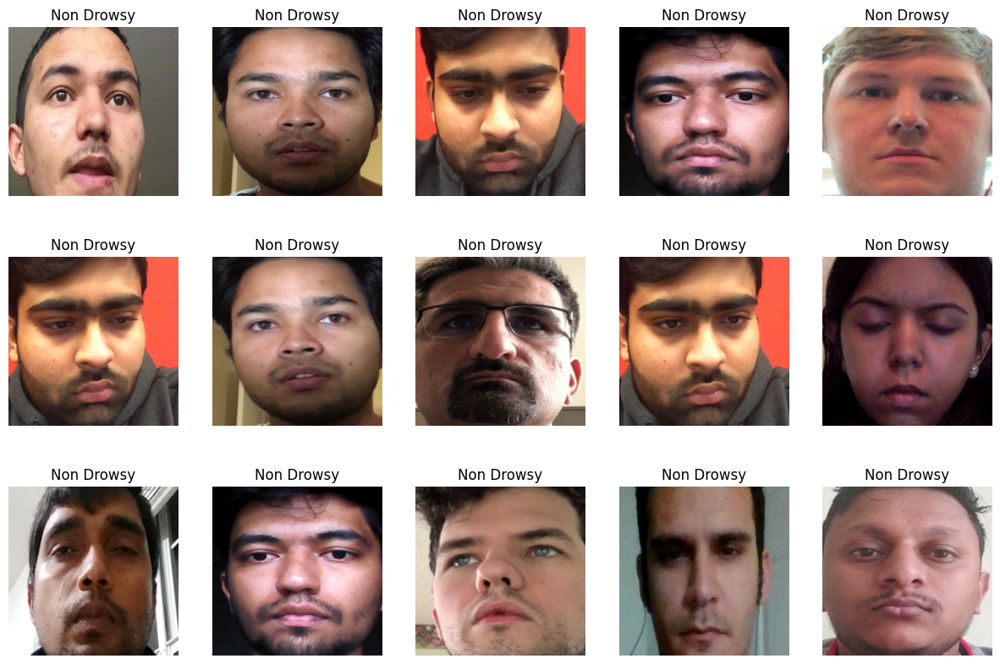

Displaying 15 random Drowsy images...


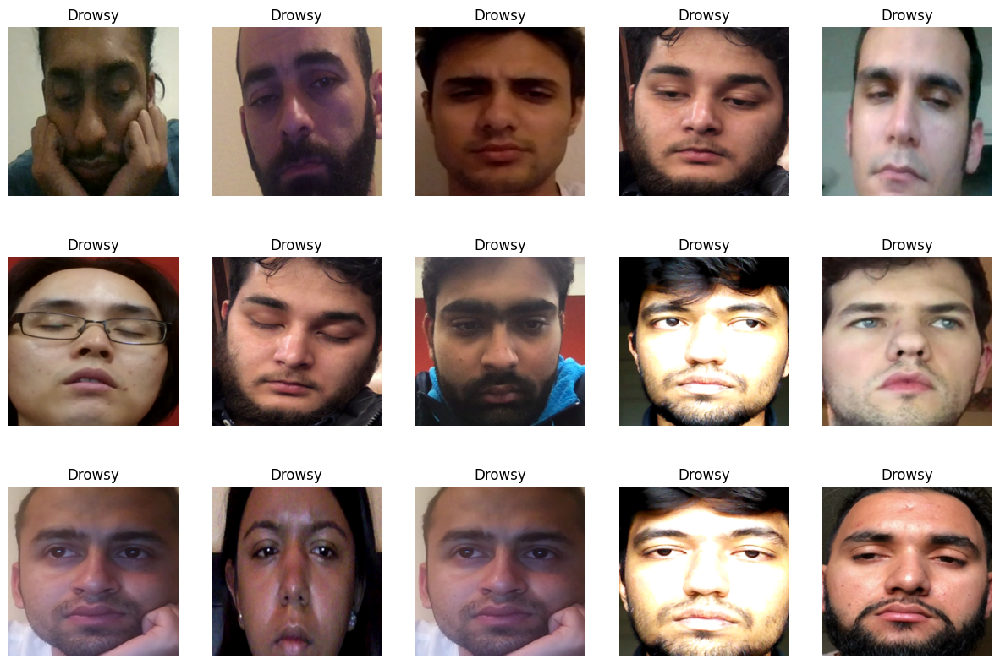

In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# Define dataset path and categories
dataset_path = './datasets/driver_drowsiness_data/Driver Drowsiness Dataset (DDD)/'
categories = ["Non Drowsy", "Drowsy"]

def display_random_images(category, num_images=15):
    """
    Randomly select and display a specified number of images from the given category.
    """
    folder_path = os.path.join(dataset_path, category)
    images = os.listdir(folder_path)

    # Randomly select the specified number of images
    random_images = random.sample(images, min(num_images, len(images)))

    # Display the selected images
    plt.figure(figsize=(15, 10))
    for i, img_name in enumerate(random_images):
        img_path = os.path.join(folder_path, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for display
        plt.subplot(3, 5, i + 1)  # Arrange images in 3 rows and 5 columns
        plt.imshow(img)
        plt.title(category)
        plt.axis('off')
    plt.show()

# Display 15 random Non Drowsy images
print("Displaying 15 random Non Drowsy images...")
display_random_images("Non Drowsy", num_images=15)

# Display 15 random Drowsy images
print("Displaying 15 random Drowsy images...")
display_random_images("Drowsy", num_images=15)


From the displayed images, we noticed:

***1. Lighting Variations:***Some images have inconsistent lighting (e.g., overexposed or underexposed).

***2. Angle and Perspective:*** Some images have faces tilted or partially captured.

***3. Background Irrelevance:*** A few images seem to have distracting backgrounds.

**A) Steps for Cleaning**

***1. Face Detection:*** Crop only the face region from each image to remove irrelevant background details. Use a pre-trained face detection model like Haar Cascade or MTCNN for better precision.

***2. Remove Poorly Captured Images:*** Detect very dark or overly bright images (use average pixel intensity as a threshold) and remove them.

***3. Remove Duplicates:*** Use hashing or filename matching to identify duplicate images and remove them.

2. Data Augmentation Recommendations
To improve generalization, apply the following augmentations:

**B. Augmentation Techniques:**

***1. Flipping:*** Apply horizontal flipping to simulate mirror images.

***2. Rotation:*** Apply small rotations (e.g., ±10 degrees) to handle slight angular variations.

***3. Brightness Adjustment:*** Randomly increase or decrease brightness to handle lighting variability.

***4. Zooming:*** Randomly zoom in or out to simulate different perspectives.
Noise Addition: Add small random noise to simulate real-world conditions.

**Image Cleaning and Augmenting**

***1. Face Detection***

In [ ]:
import cv2
import os

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

def crop_faces(input_folder, output_folder):
    os.makedirs(output_folder, exist_ok=True)
    for img_name in os.listdir(input_folder):
        img_path = os.path.join(input_folder, img_name)
        img = cv2.imread(img_path)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)
        for (x, y, w, h) in faces:
            face = img[y:y+h, x:x+w]
            save_path = os.path.join(output_folder, img_name)
            cv2.imwrite(save_path, face)
# Apply to both categories
crop_faces('./datasets/driver_drowsiness_data/Driver Drowsiness Dataset (DDD)/Non Drowsy', './cleaned/Non Drowsy')
crop_faces('./datasets/driver_drowsiness_data/Driver Drowsiness Dataset (DDD)/Drowsy', './cleaned/Drowsy')


Check the result

Displaying 15 random Non Drowsy images...


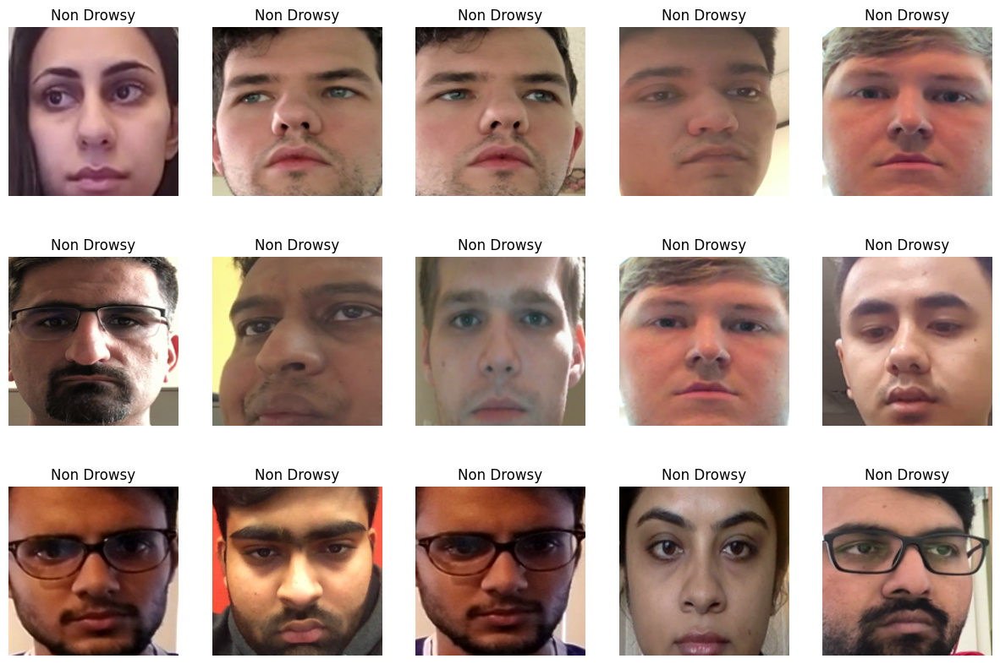

Displaying 15 random Drowsy images...


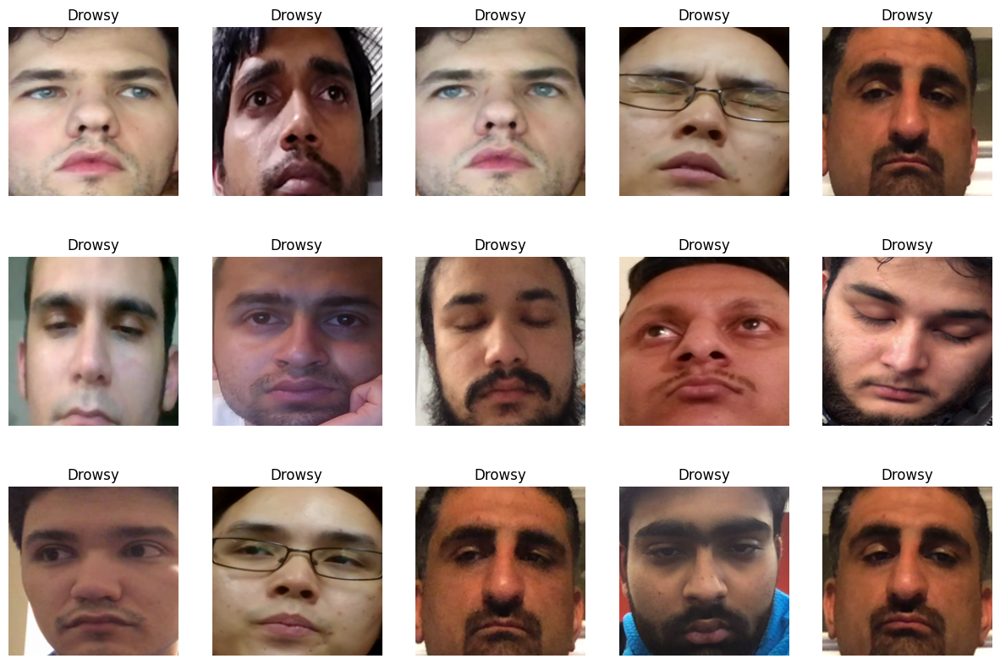

In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# Define dataset path and categories
dataset_path = './cleaned/'
categories = ["Non Drowsy", "Drowsy"]

# Display 15 random Non Drowsy images
print("Displaying 15 random Non Drowsy images...")
display_random_images("Non Drowsy", num_images=15)

# Display 15 random Drowsy images
print("Displaying 15 random Drowsy images...")
display_random_images("Drowsy", num_images=15)

***2. Augmenting the images***

In [ ]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the data augmentation parameters
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Paths
data_dir = './cleaned/'
save_dir = './augmented/'

# Ensure save directory exists
os.makedirs(save_dir, exist_ok=True)

# Process each class separately
classes = ['Drowsy', 'Non Drowsy']
batch_size = 32  # Number of images to process in each batch

for class_name in classes:
    class_dir = os.path.join(data_dir, class_name)
    save_class_dir = os.path.join(save_dir, class_name)
    os.makedirs(save_class_dir, exist_ok=True)

    # Create data generator for the specific class
    data_generator = datagen.flow_from_directory(
        data_dir,
        classes=[class_name],
        target_size=(224, 224),
        batch_size=batch_size,
        class_mode=None,
        save_to_dir=save_class_dir,
        save_prefix='aug',
        save_format='jpeg',
        shuffle=False
    )

    # Initialize counters
    total_augmented = 0
    total_images = len(os.listdir(class_dir))

    # Generate and save augmented images in batches
    while total_augmented < total_images:
        # Generate a batch of augmented images
        batch = next(data_generator)
        batch_size = batch.shape[0]
        total_augmented += batch_size
        print(f'Class: {class_name} - Total augmented images: {total_augmented}/{total_images}')

        # Save progress after each batch
        # (In this setup, images are saved automatically by `flow_from_directory`)

        # Break the loop if all images have been processed
        if total_augmented >= total_images:
            break


Found 20427 images belonging to 1 classes.
Class: Drowsy - Total augmented images: 32/20427
Class: Drowsy - Total augmented images: 64/20427
Class: Drowsy - Total augmented images: 96/20427
Class: Drowsy - Total augmented images: 128/20427
Class: Drowsy - Total augmented images: 160/20427
Class: Drowsy - Total augmented images: 192/20427
Class: Drowsy - Total augmented images: 224/20427
Class: Drowsy - Total augmented images: 256/20427
Class: Drowsy - Total augmented images: 288/20427
Class: Drowsy - Total augmented images: 320/20427
Class: Drowsy - Total augmented images: 352/20427
Class: Drowsy - Total augmented images: 384/20427
Class: Drowsy - Total augmented images: 416/20427
Class: Drowsy - Total augmented images: 448/20427
Class: Drowsy - Total augmented images: 480/20427
Class: Drowsy - Total augmented images: 512/20427
Class: Drowsy - Total augmented images: 544/20427
Class: Drowsy - Total augmented images: 576/20427
Class: Drowsy - Total augmented images: 608/20427
Class: Dro

Show poorly captured images after augmentation

Total low-quality images in './augmented/Non Drowsy': 0


<Figure size 640x480 with 0 Axes>

Total low-quality images in './augmented/Drowsy': 39


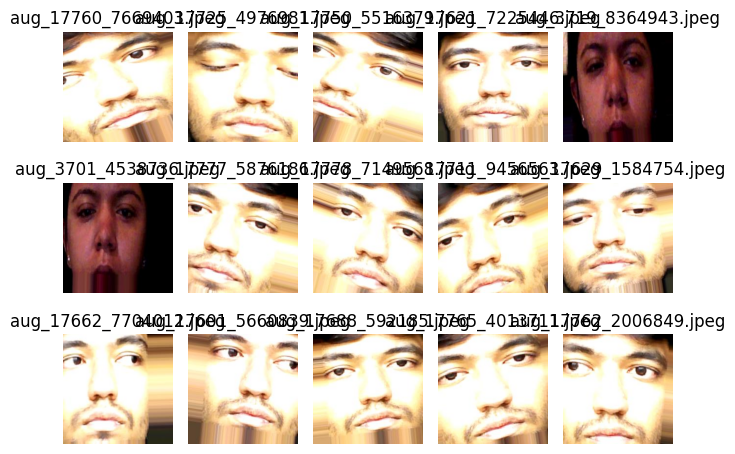

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

def find_low_quality_images(folder, low_threshold=50, high_threshold=200, sample_size=15):
    low_quality_images = []
    for img_name in os.listdir(folder):
        img_path = os.path.join(folder, img_name)
        img = cv2.imread(img_path)
        if img is not None:
            avg_intensity = img.mean()
            if avg_intensity < low_threshold or avg_intensity > high_threshold:
                low_quality_images.append(img_path)

    total_low_quality = len(low_quality_images)
    print(f"Total low-quality images in '{folder}': {total_low_quality}")

    # Display a sample of low-quality images
    sample_images = low_quality_images[:sample_size]
    for i, img_path in enumerate(sample_images):
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(3, 5, i + 1)
        plt.imshow(img_rgb)
        plt.title(os.path.basename(img_path))
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Directories to check
folders = ['./augmented/Non Drowsy', './augmented/Drowsy']

for folder in folders:
    find_low_quality_images(folder)


3. Removing poorly captured images

In [ ]:
def remove_low_quality_images(folder):
    for img_name in os.listdir(folder):
        img_path = os.path.join(folder, img_name)
        img = cv2.imread(img_path)
        avg_intensity = img.mean()
        if avg_intensity < 50 or avg_intensity > 200:  # Adjust thresholds
            print(f"Removing low-quality image: {img_path}")
            os.remove(img_path)

remove_low_quality_images('./cleaned/Non Drowsy')
remove_low_quality_images('./cleaned/Drowsy')


Removing low-quality image: ./cleaned/Non Drowsy/e0441.png
Removing low-quality image: ./cleaned/Non Drowsy/e0483.png
Removing low-quality image: ./cleaned/Drowsy/E0295.png
Removing low-quality image: ./cleaned/Drowsy/H0043.png
Removing low-quality image: ./cleaned/Drowsy/H0005.png
Removing low-quality image: ./cleaned/Drowsy/E0425.png
Removing low-quality image: ./cleaned/Drowsy/H0130.png
Removing low-quality image: ./cleaned/Drowsy/E0161.png
Removing low-quality image: ./cleaned/Drowsy/E0411.png
Removing low-quality image: ./cleaned/Drowsy/E0279.png
Removing low-quality image: ./cleaned/Drowsy/H0126.png
Removing low-quality image: ./cleaned/Drowsy/H0047.png
Removing low-quality image: ./cleaned/Drowsy/H0111.png
Removing low-quality image: ./cleaned/Drowsy/E0219.png
Removing low-quality image: ./cleaned/Drowsy/E0937.png
Removing low-quality image: ./cleaned/Drowsy/E0155.png
Removing low-quality image: ./cleaned/Drowsy/H0104.png
Removing low-quality image: ./cleaned/Drowsy/E0450.png
Re

Check the result

Displaying 15 random Non Drowsy images...


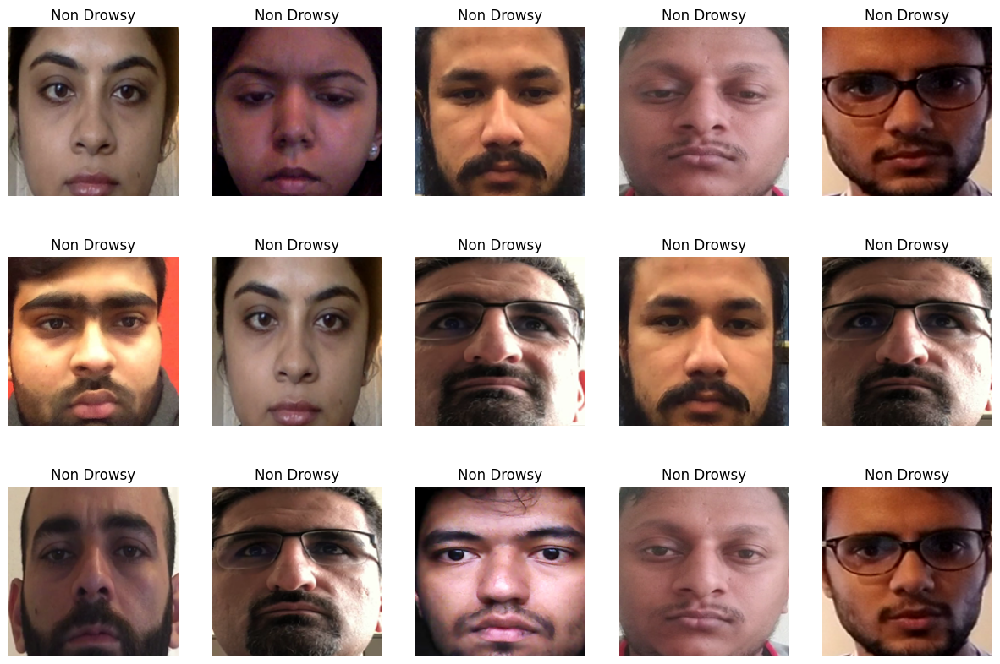

Displaying 15 random Drowsy images...


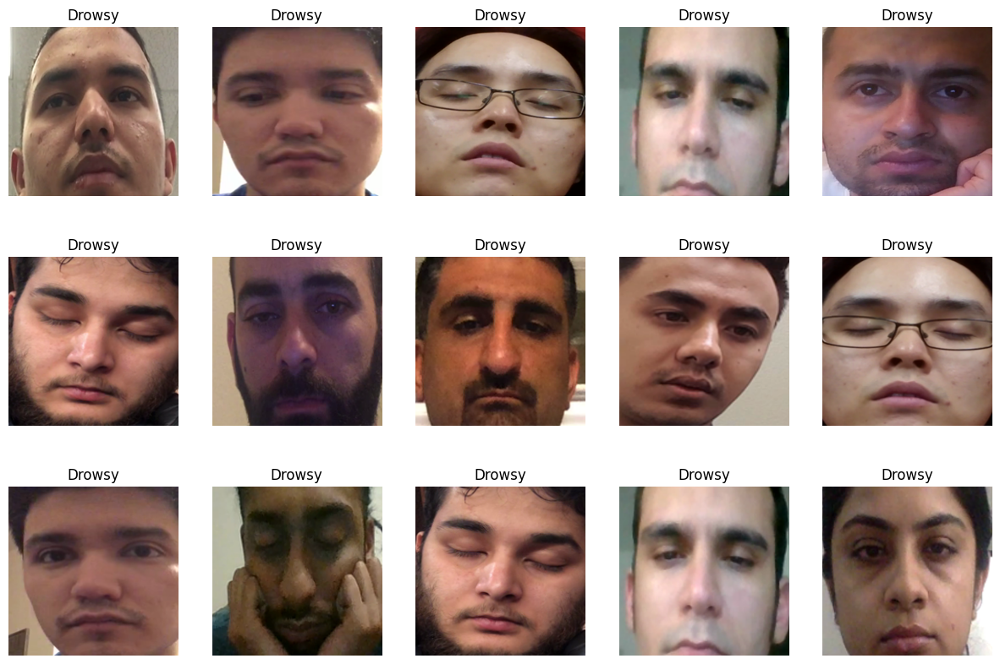

In [ ]:
# Display 15 random Non Drowsy images
print("Displaying 15 random Non Drowsy images...")
display_random_images("Non Drowsy", num_images=15)

# Display 15 random Drowsy images
print("Displaying 15 random Drowsy images...")
display_random_images("Drowsy", num_images=15)

**Checking for Balanced Dataset**

In [ ]:
import os

non_drowsy_count = len(os.listdir('./augmented/Non Drowsy'))
drowsy_count = len(os.listdir('./augmented/Drowsy'))

print(f"Non Drowsy images: {non_drowsy_count}")
print(f"Drowsy images: {drowsy_count}")


Non Drowsy images: 17868
Drowsy images: 20155


***Checking for diversity***

1. Checking Image Brightness Distribution


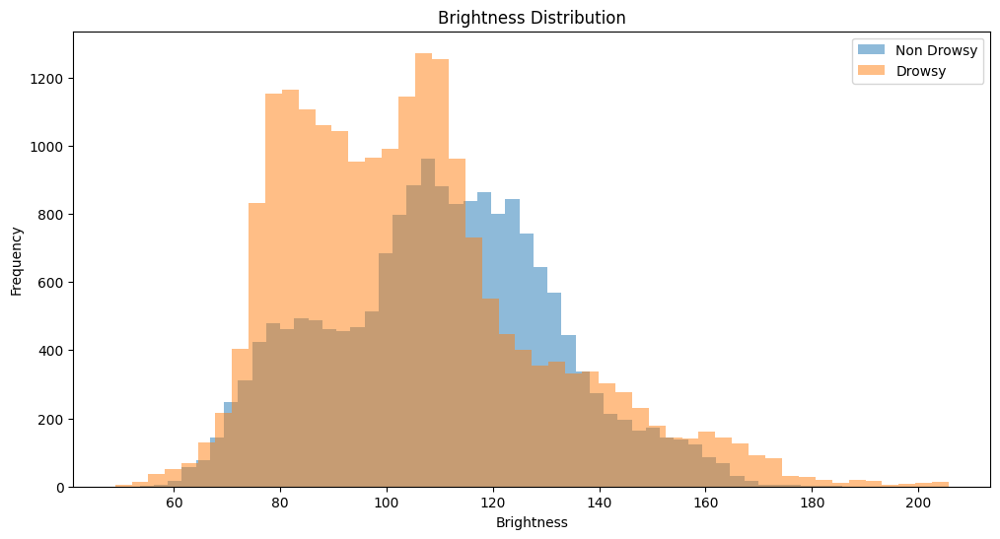

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

def compute_brightness(folder):
    brightness_values = []
    for img_name in os.listdir(folder):
        img_path = os.path.join(folder, img_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Convert to grayscale
        mean_brightness = img.mean()  # Compute mean pixel intensity
        brightness_values.append(mean_brightness)
    return brightness_values

# Compute brightness for both categories
non_drowsy_brightness = compute_brightness('./augmented/Non Drowsy')
drowsy_brightness = compute_brightness('./augmented/Drowsy')

# Plot the brightness distributions
plt.figure(figsize=(12, 6))
plt.hist(non_drowsy_brightness, bins=50, alpha=0.5, label='Non Drowsy')
plt.hist(drowsy_brightness, bins=50, alpha=0.5, label='Drowsy')
plt.xlabel('Brightness')
plt.ylabel('Frequency')
plt.title('Brightness Distribution')
plt.legend()
plt.show()


**Observation:** Both categories have a similar brightness distribution, although the Drowsy category has slightly more low-brightness images compared to Non Drowsy.

***Action:***
- This is acceptable as long as the model can generalize. No specific augmentation is needed unless low-brightness images impact model performance.
- If performance issues arise, we could use brightness adjustment augmentation to balance the range.

2. Checking Image Color Variance

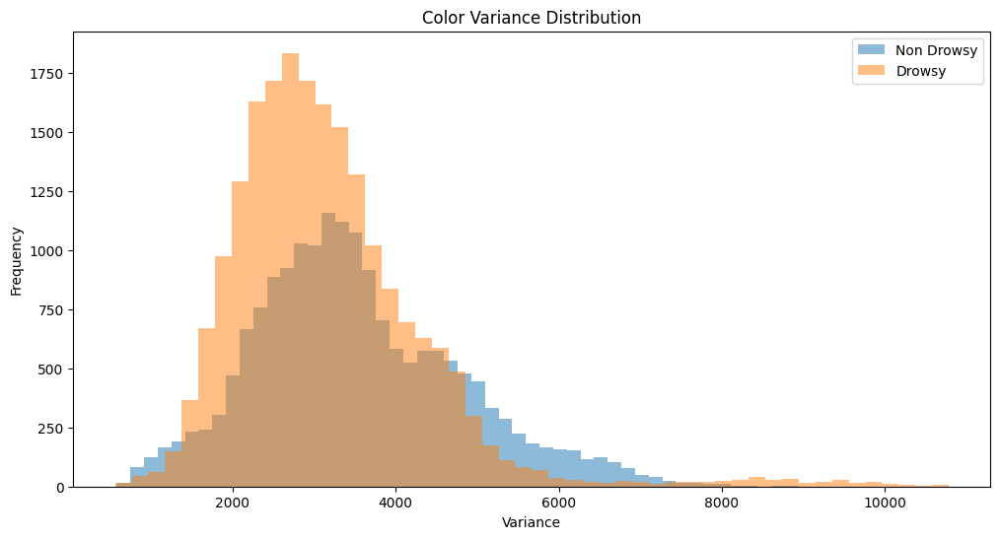

In [ ]:
def compute_color_variance(folder):
    variances = []
    for img_name in os.listdir(folder):
        img_path = os.path.join(folder, img_name)
        img = cv2.imread(img_path)  # Load the image
        variance = np.var(img)  # Compute variance of pixel values
        variances.append(variance)
    return variances

# Compute color variance for both categories
non_drowsy_variance = compute_color_variance('./augmented/Non Drowsy')
drowsy_variance = compute_color_variance('./augmented/Drowsy')

# Plot the color variance distributions
plt.figure(figsize=(12, 6))
plt.hist(non_drowsy_variance, bins=50, alpha=0.5, label='Non Drowsy')
plt.hist(drowsy_variance, bins=50, alpha=0.5, label='Drowsy')
plt.xlabel('Variance')
plt.ylabel('Frequency')
plt.title('Color Variance Distribution')
plt.legend()
plt.show()


**Observation:** Both distributions overlap significantly, indicating similar levels of color diversity.

**Action:**
- No immediate action required since the overlap is high. Both classes seem to have reasonable color variations.
- If we notice model bias during training, we could augment with color jitter to increase variance.

3. Checking Image Orientation (Edge Detection)

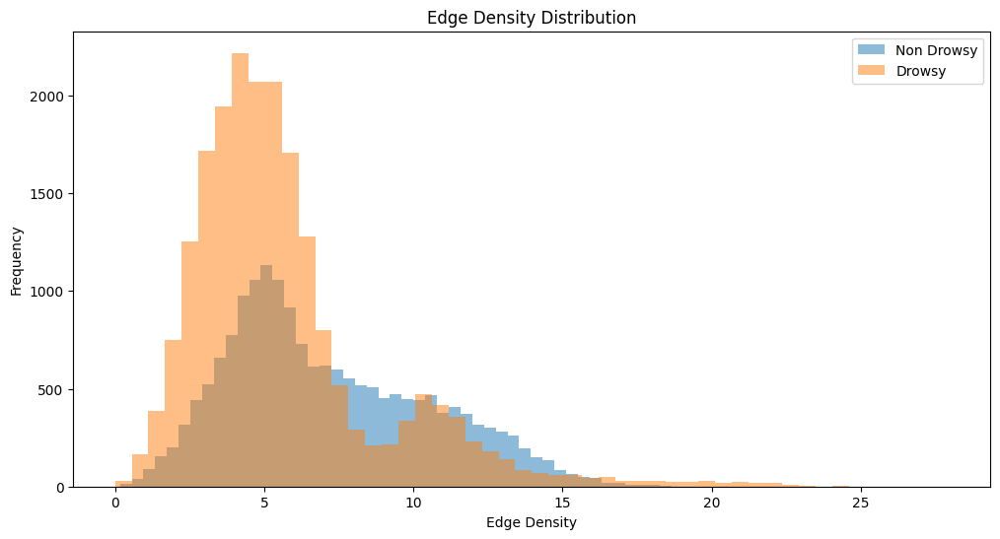

In [ ]:
def compute_edge_density(folder):
    densities = []
    for img_name in os.listdir(folder):
        img_path = os.path.join(folder, img_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Convert to grayscale
        edges = cv2.Canny(img, 100, 200)  # Detect edges
        density = np.sum(edges) / (img.shape[0] * img.shape[1])  # Edge density
        densities.append(density)
    return densities

# Compute edge density for both categories
non_drowsy_edges = compute_edge_density('./augmented/Non Drowsy')
drowsy_edges = compute_edge_density('./augmented/Drowsy')

# Plot edge density distributions
plt.figure(figsize=(12, 6))
plt.hist(non_drowsy_edges, bins=50, alpha=0.5, label='Non Drowsy')
plt.hist(drowsy_edges, bins=50, alpha=0.5, label='Drowsy')
plt.xlabel('Edge Density')
plt.ylabel('Frequency')
plt.title('Edge Density Distribution')
plt.legend()
plt.show()


**Observation:** The edge density distributions show overlap, but Drowsy has more high-density edges compared to Non Drowsy.

**Action:**
- No immediate action is necessary as there is sufficient overlap, but will keep this in mind during training.

- If edge density skews results (e.g., overfitting to sharper or less defined edges), we could consider applying slight blurring or noise to even out differences.

4. Removing duplicates using perceptual hashing

In [ ]:
from PIL import Image
import imagehash
import os

def remove_duplicates(folder):
    """
    Remove duplicate images using perceptual hashing.
    """
    hashes = {}
    for img_name in os.listdir(folder):
        img_path = os.path.join(folder, img_name)
        img = Image.open(img_path)
        hash_val = imagehash.phash(img)
        if hash_val in hashes:
            print(f"Removing duplicate: {img_path}")
            os.remove(img_path)
        else:
            hashes[hash_val] = img_name

# Remove duplicates from both categories
remove_duplicates('./augmented/Non Drowsy')
remove_duplicates('./augmented/Drowsy')


Streaming output truncated to the last 5000 lines.
Removing duplicate: ./cleaned/Drowsy/I0997.png
Removing duplicate: ./cleaned/Drowsy/P0613.png
Removing duplicate: ./cleaned/Drowsy/N0062.png
Removing duplicate: ./cleaned/Drowsy/P0526.png
Removing duplicate: ./cleaned/Drowsy/P1000.png
Removing duplicate: ./cleaned/Drowsy/ZC0468.png
Removing duplicate: ./cleaned/Drowsy/X1547.png
Removing duplicate: ./cleaned/Drowsy/ZC0474.png
Removing duplicate: ./cleaned/Drowsy/U0142.png
Removing duplicate: ./cleaned/Drowsy/ZB0585.png
Removing duplicate: ./cleaned/Drowsy/P0649.png
Removing duplicate: ./cleaned/Drowsy/X1712.png
Removing duplicate: ./cleaned/Drowsy/ZA0275.png
Removing duplicate: ./cleaned/Drowsy/A0931.png
Removing duplicate: ./cleaned/Drowsy/N0181.png
Removing duplicate: ./cleaned/Drowsy/N0509.png
Removing duplicate: ./cleaned/Drowsy/N0495.png
Removing duplicate: ./cleaned/Drowsy/A0649.png
Removing duplicate: ./cleaned/Drowsy/A0080.png
Removing duplicate: ./cleaned/Drowsy/P0633.png
Remov

5. Dataset Balance Visualization

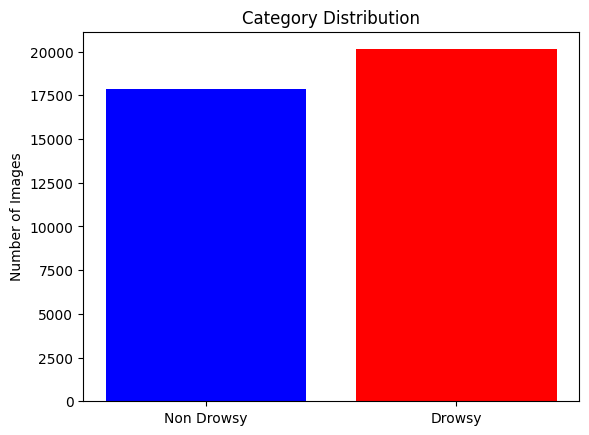

In [ ]:
categories = ['Non Drowsy', 'Drowsy']
counts = [non_drowsy_count, drowsy_count]

plt.bar(categories, counts, color=['blue', 'red'])
plt.title('Category Distribution')
plt.ylabel('Number of Images')
plt.show()


In [ ]:
import os

non_drowsy_count = len(os.listdir('./augmented/Non Drowsy'))
drowsy_count = len(os.listdir('./augmented/Drowsy'))

print(f"Non Drowsy images: {non_drowsy_count}")
print(f"Drowsy images: {drowsy_count}")


Non Drowsy images: 17870
Drowsy images: 20388


**Displaying random images of both categories**

Displaying 18 random Non Drowsy images...


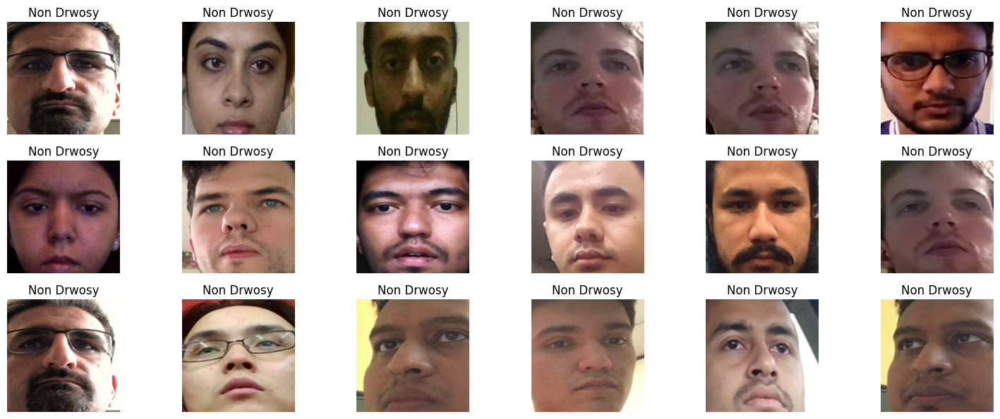

Displaying 18 random Drowsy images...


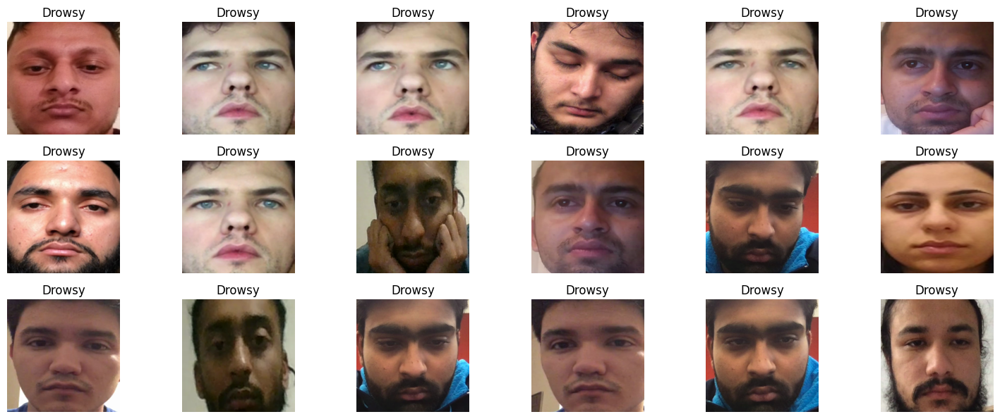

In [ ]:
import os
import cv2
import random
import matplotlib.pyplot as plt

# Define dataset path and categories
dataset_path = './augmented/'
categories = ["Non Drowsy", "Drowsy"]

# Display 18 random Non Drowsy images
print("Displaying 18 random Non Drowsy images...")
display_random_images("./augmented/Non Drowsy",'Non Drwosy', num_images=18)

# Display 18 random Drowsy images
print("Displaying 18 random Drowsy images...")
display_random_images("./augmented/Drowsy", 'Drowsy', num_images=18)

**Key Observations:**

***Diversity:***
- The images show variations in lighting, facial orientations, and features (e.g., glasses, skin tones).
- There is no overwhelming dominance of any single pattern in either category.

***Balance:***
- The dataset is numerically balanced after removing duplicates.
- There is a good visual representation of both classes.


**Saving the augmented image in google drive to avoid re-processing**

In [ ]:
import os
import shutil
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define source and target paths
source_non_drowsy = './augmented/Non Drowsy'
source_drowsy = './augmented/Drowsy'

target_base = '/content/drive/MyDrive/SanDiego/driver_drowsiness/cleaned'
target_non_drowsy = os.path.join(target_base, 'Non Drowsy')
target_drowsy = os.path.join(target_base, 'Drowsy')

# Create target directories in Google Drive
os.makedirs(target_non_drowsy, exist_ok=True)
os.makedirs(target_drowsy, exist_ok=True)

# Function to copy files
def copy_images(source_folder, target_folder):
    for img_name in os.listdir(source_folder):
        src_path = os.path.join(source_folder, img_name)
        tgt_path = os.path.join(target_folder, img_name)
        shutil.copy(src_path, tgt_path)
        print(f"Copied {img_name} to {target_folder}")

# Copy Non Drowsy images
print("Copying Non Drowsy images...")
copy_images(source_non_drowsy, target_non_drowsy)

# Copy Drowsy images
print("Copying Drowsy images...")
copy_images(source_drowsy, target_drowsy)

print("All images saved to Google Drive!")


Streaming output truncated to the last 5000 lines.
Copied aug_8092_2531509.jpeg to /content/drive/MyDrive/driver_drowsiness/augmented/Drowsy
Copied aug_4966_8421507.jpeg to /content/drive/MyDrive/driver_drowsiness/augmented/Drowsy
Copied aug_9593_3674465.jpeg to /content/drive/MyDrive/driver_drowsiness/augmented/Drowsy
Copied aug_3132_1791509.jpeg to /content/drive/MyDrive/driver_drowsiness/augmented/Drowsy
Copied aug_6688_1098142.jpeg to /content/drive/MyDrive/driver_drowsiness/augmented/Drowsy
Copied aug_830_8851706.jpeg to /content/drive/MyDrive/driver_drowsiness/augmented/Drowsy
Copied aug_4203_3418349.jpeg to /content/drive/MyDrive/driver_drowsiness/augmented/Drowsy
Copied aug_6663_2818290.jpeg to /content/drive/MyDrive/driver_drowsiness/augmented/Drowsy
Copied aug_19656_9985217.jpeg to /content/drive/MyDrive/driver_drowsiness/augmented/Drowsy
Copied aug_7801_8716062.jpeg to /content/drive/MyDrive/driver_drowsiness/augmented/Drowsy
Copied aug_18394_4742587.jpeg to /content/drive/M

**Displaying 30 random images from each folder**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Displaying random Drowsy images...


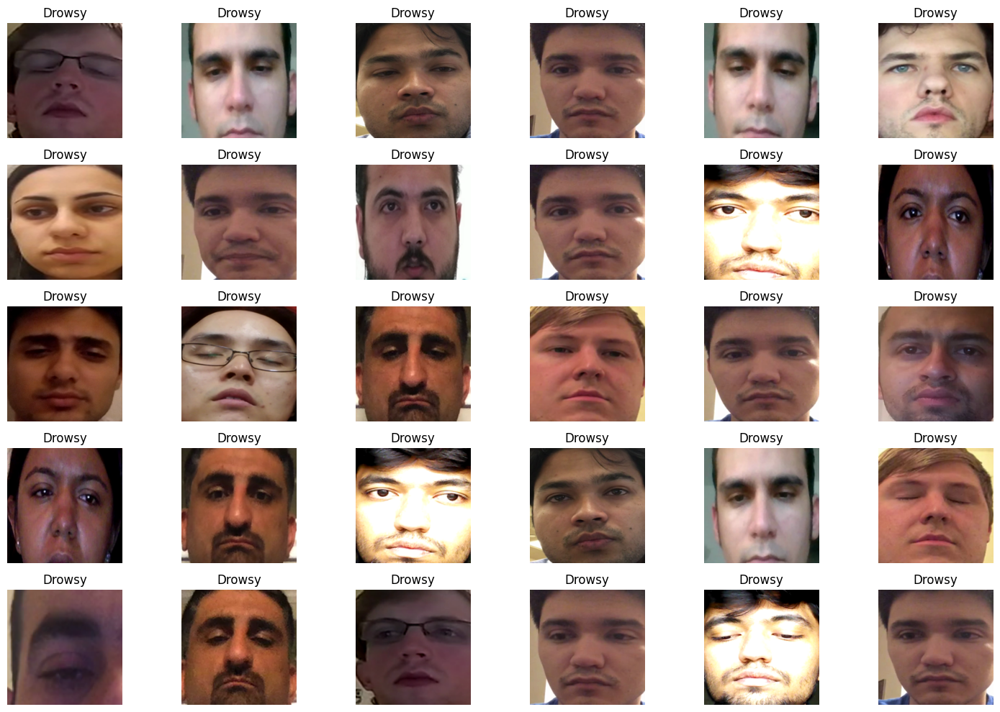

Displaying random Non Drowsy images...


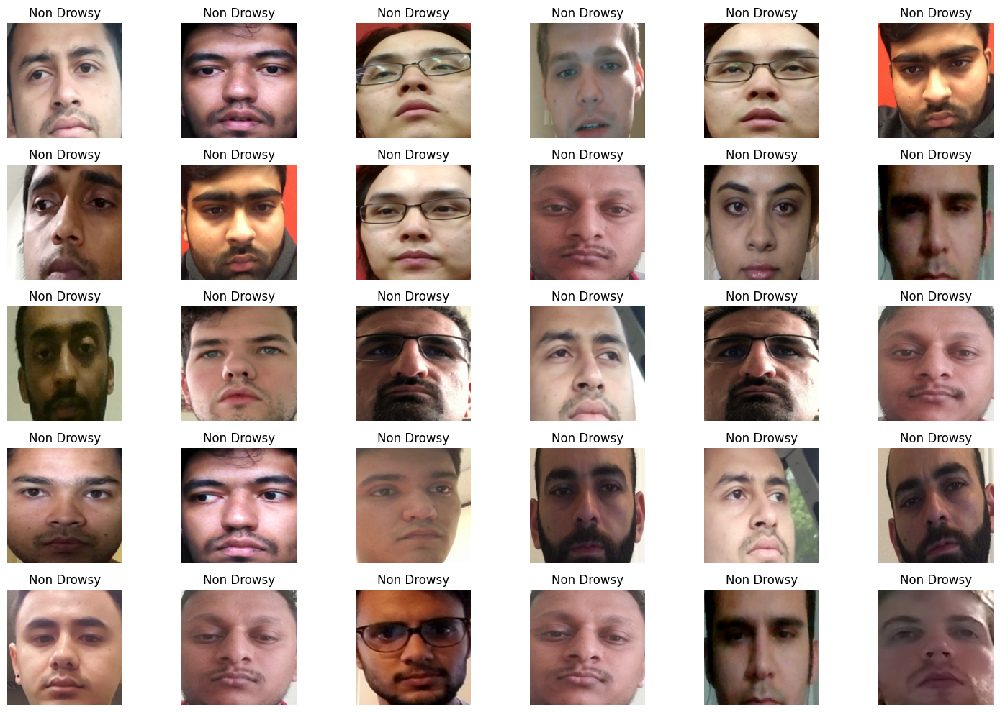

In [ ]:
import os
import random
import cv2
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/drive')

# Define paths to image folders
drowsy_folder = '/content/drive/MyDrive/driver_drowsiness/cleaned/Drowsy'
non_drowsy_folder = '/content/drive/MyDrive/driver_drowsiness/cleaned/Non Drowsy'

# Function to display random images
def display_random_images(folder, title, num_images=30):
    image_files = os.listdir(folder)
    random_images = random.sample(image_files, min(num_images, len(image_files)))

    # Set up plot
    plt.figure(figsize=(15, 10))
    for i, img_name in enumerate(random_images):
        img_path = os.path.join(folder, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB for displaying

        plt.subplot(5, 6, i + 1)  # Create a grid of 5x6
        plt.imshow(img)
        plt.axis('off')
        plt.title(title)

    plt.tight_layout()
    plt.show()

# Display 30 random images from each folder
print("Displaying random Drowsy images...")
display_random_images(drowsy_folder, "Drowsy", num_images=30)

print("Displaying random Non Drowsy images...")
display_random_images(non_drowsy_folder, "Non Drowsy", num_images=30)


# **Building Models, Training and Validation**

In [ ]:
# Download the shape predictor file
!wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2

# Extract the .bz2 file
!bzip2 -d shape_predictor_68_face_landmarks.dat.bz2


--2024-12-08 13:08:34--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2’

shape_predictor_68_ 100%[===================>]  61.07M  43.0MB/s    in 1.4s    

2024-12-08 13:08:35 (43.0 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2’ saved [64040097/64040097]



In [ ]:
from google.colab import drive
drive.mount('/content/drive')
# Define the destination path in Google Drive
destination_path = '/content/drive/MyDrive/driver_drowsiness/shape_predictor_68_face_landmarks.dat'

# Move the file
!mv shape_predictor_68_face_landmarks.dat {destination_path}


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import dlib

from google.colab import drive
drive.mount('/content/drive')

# Path to the shape predictor file in Google Drive
predictor_path = '/content/drive/MyDrive/driver_drowsiness/shape_predictor_68_face_landmarks.dat'

# Load dlib's face detector and facial landmark predictor
face_detector = dlib.get_frontal_face_detector()
landmark_predictor = dlib.shape_predictor(predictor_path)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
if os.path.exists(predictor_path):
    print("Shape predictor file loaded successfully!")
else:
    print("File not found. Please check the path.")


Shape predictor file loaded successfully!


**The plan forward:**

*   Simulate Temporal Data from Images:

Use a sequence of consecutive images from your dataset to
simulate temporal changes (e.g., a sequence of 10 images to analyze EAR/MAR trends).

Group images into sliding windows to mimic frames in a video.

*   Extract Features from Images:

For each image in the sequence, extract EAR, MAR, PERCLOS, and other relevant metrics.

 Compute behavioral patterns (e.g., yawning, blink rate) based on the extracted features.

*  Train a Model on Extracted Features:

Instead of training on raw images, train a machine learning model on extracted feature sequences.


**Simulate Temporal Data from images**

***1. Feature Extraction***

Divide Dataset into Batches for handling memory and disconnection issues

In [ ]:
import os
import math
import pandas as pd
import random

# Paths to the cleaned image folders
drowsy_folder = '/content/drive/MyDrive/SanDiego/driver_drowsiness/cleaned/Drowsy'
non_drowsy_folder = '/content/drive/MyDrive/SanDiego/driver_drowsiness/cleaned/Non Drowsy'

# Batch size
batch_size = 500

# Prepare image paths and labels
drowsy_images = [(os.path.join(drowsy_folder, img), 1) for img in os.listdir(drowsy_folder)]
non_drowsy_images = [(os.path.join(non_drowsy_folder, img), 0) for img in os.listdir(non_drowsy_folder)]
all_images = drowsy_images + non_drowsy_images

# Shuffle and split into batches
# random.shuffle(all_images)
num_batches = math.ceil(len(all_images) / batch_size)
print(f"Total images: {len(all_images)}, Number of batches: {num_batches}")


Total images: 21991, Number of batches: 44


Process Each Batch and Save to CSV

In [ ]:
import cv2
import dlib
from imutils import face_utils
import numpy as np

# Load dlib's face detector and landmark predictor
face_detector = dlib.get_frontal_face_detector()
predictor_path = '/content/drive/MyDrive/driver_drowsiness/shape_predictor_68_face_landmarks.dat'

landmark_predictor = dlib.shape_predictor(predictor_path)

# EAR and MAR calculation functions
def compute_ear(eye_points):
    A = np.linalg.norm(eye_points[1] - eye_points[5])
    B = np.linalg.norm(eye_points[2] - eye_points[4])
    C = np.linalg.norm(eye_points[0] - eye_points[3])
    return (A + B) / (2.0 * C)

def compute_mar(mouth_points):
    A = np.linalg.norm(mouth_points[13] - mouth_points[19])
    B = np.linalg.norm(mouth_points[12] - mouth_points[16])
    return A / B

def compute_gaze_direction(landmarks):
    left_eye = landmarks[36:42]
    right_eye = landmarks[42:48]
    left_center = left_eye.mean(axis=0)
    right_center = right_eye.mean(axis=0)
    gaze_vector = right_center - left_center
    return np.linalg.norm(gaze_vector)


# Process a single batch
def process_batch(batch_images, batch_num, output_folder):
    data = []
    for img_path, label in batch_images:
        img = cv2.imread(img_path)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        faces = face_detector(gray)

        # If no face is detected, skip the image
        if len(faces) == 0:
            continue

        for face in faces:
            landmarks = landmark_predictor(gray, face)
            landmarks = face_utils.shape_to_np(landmarks)

            # EAR and MAR
            left_eye = landmarks[36:42]
            right_eye = landmarks[42:48]
            mouth = landmarks[48:68]

            ear = (compute_ear(left_eye) + compute_ear(right_eye)) / 2.0
            mar = compute_mar(mouth)

            gaze_direction = compute_gaze_direction(landmarks)

            # Save features and label
            data.append({'EAR': ear, 'MAR': mar,'Gaze_Direction': gaze_direction, 'Label': label})
            break  # Process only the first detected face

    # Save the batch to a CSV file
    batch_file = os.path.join(output_folder, f'features_batch_{batch_num}.csv')
    pd.DataFrame(data).to_csv(batch_file, index=False)
    print(f"Batch {batch_num} saved to {batch_file}")


Process all batches and save the features in a csv file

In [ ]:
# Output folder for batch CSVs
output_folder = '/content/drive/MyDrive/SanDiego/driver_drowsiness/features'
os.makedirs(output_folder, exist_ok=True)

# Get already processed batches
processed_batches = [f for f in os.listdir(output_folder) if f.startswith('features_batch_')]
processed_batch_nums = [int(f.split('_')[2].split('.')[0]) for f in processed_batches]

# Process remaining batches
for batch_num in range(num_batches):
    if batch_num in processed_batch_nums:
        print(f"Skipping already processed batch {batch_num}")
        continue

    start_idx = batch_num * batch_size
    end_idx = min((batch_num + 1) * batch_size, len(all_images))
    batch_images = all_images[start_idx:end_idx]

    print(f"Processing batch {batch_num} with {len(batch_images)} images...")
    process_batch(batch_images, batch_num, output_folder)


Processing batch 0 with 500 images...
Batch 0 saved to /content/drive/MyDrive/SanDiego/driver_drowsiness/features/features_batch_0.csv
Processing batch 1 with 500 images...
Batch 1 saved to /content/drive/MyDrive/SanDiego/driver_drowsiness/features/features_batch_1.csv
Processing batch 2 with 500 images...
Batch 2 saved to /content/drive/MyDrive/SanDiego/driver_drowsiness/features/features_batch_2.csv
Processing batch 3 with 500 images...
Batch 3 saved to /content/drive/MyDrive/SanDiego/driver_drowsiness/features/features_batch_3.csv
Processing batch 4 with 500 images...
Batch 4 saved to /content/drive/MyDrive/SanDiego/driver_drowsiness/features/features_batch_4.csv
Processing batch 5 with 500 images...
Batch 5 saved to /content/drive/MyDrive/SanDiego/driver_drowsiness/features/features_batch_5.csv
Processing batch 6 with 500 images...
Batch 6 saved to /content/drive/MyDrive/SanDiego/driver_drowsiness/features/features_batch_6.csv
Processing batch 7 with 500 images...
Batch 7 saved to 

Merge Batch CSVs: Once all batches are processed, merge them into a single *dataset*

In [ ]:
# Merge all batch CSVs into a single CSV
batch_files = [os.path.join(output_folder, f) for f in os.listdir(output_folder) if f.startswith('features_batch_')]
df_list = [pd.read_csv(batch_file) for batch_file in batch_files]
merged_df = pd.concat(df_list, ignore_index=True)

# Save merged dataset
merged_file = '/content/drive/MyDrive/SanDiego/driver_drowsiness/features/features_all_images.csv'
merged_df.to_csv(merged_file, index=False)
print(f"Merged features saved to {merged_file}")


Merged features saved to /content/drive/MyDrive/SanDiego/driver_drowsiness/features/features_all_images.csv


***2. Simulate Temporal Data from Images:***

Group images into sequences to simulate temporal changes:

1. Temporal Features
- EAR_mean and MAR_mean: Average EAR and MAR across a sequence, indicating typical eye and mouth states.

- EAR_variance and MAR_variance: Variance captures changes like blinking or yawning.

- PERCLOS: Percentage of frames in the sequence where EAR < 0.2, indicating eye closure.

2. Temporal Sequences: - By grouping images into sequences, we simulate temporal data even though the dataset consists of static images.
3. Sliding Window:  A step size smaller than the sequence length (e.g., step_size=5) ensures overlap between consecutive sequences, capturing finer temporal patterns.



Prepare Sequences

In [ ]:
import pandas as pd
import numpy as np
import os
import shutil
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')
# Load features dataset
file_path = '/content/drive/MyDrive/SanDiego/driver_drowsiness/features/features_all_images.csv'
df = pd.read_csv(file_path)

# Sort by image filenames or indices if needed
df = df.sort_values(by='Label')  # Sort by label or another column to ensure grouping

# Define parameters for temporal sequences
sequence_length = 10  # Number of images per sequence
step_size = 5  # Step size to slide the window for sequences

# Function to create sequences
def create_sequences(data, sequence_length, step_size):
    sequences = []
    labels = []

    for i in range(0, len(data) - sequence_length + 1, step_size):
        seq = data.iloc[i:i + sequence_length][['EAR', 'MAR','Gaze_Direction']].values
        label = data.iloc[i + sequence_length - 1]['Label']  # Use the last label in the sequence
        sequences.append(seq)
        labels.append(label)

    return np.array(sequences), np.array(labels)

# Generate sequences
X_sequences, y_sequences = create_sequences(df, sequence_length, step_size)

print(f"Generated {len(X_sequences)} sequences of shape {X_sequences.shape}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Generated 3462 sequences of shape (3462, 10, 3)


Define Functions for Temporal Extraction

In [ ]:
# Compute Blink Rate: Number of blinks in a sequence
def compute_blink_rate(ear_sequence, threshold=0.2):
    blinks = np.diff((ear_sequence < threshold).astype(int)) == 1
    return np.sum(blinks)

# Compute Yawning Frequency: Number of yawns in a sequence
def compute_yawning_frequency(mar_sequence, threshold=0.5):
    yawns = np.diff((mar_sequence > threshold).astype(int)) == 1
    return np.sum(yawns)

# Compute Inactivity Time: Duration of minimal facial movement
def compute_inactivity_time(ear_sequence, mar_sequence, tolerance=0.05):
    ear_changes = np.abs(np.diff(ear_sequence)) < tolerance
    mar_changes = np.abs(np.diff(mar_sequence)) < tolerance
    inactivity_frames = np.sum(ear_changes & mar_changes)
    return inactivity_frames

# Compute Eye Closure Duration: Longest consecutive frames with EAR < threshold
def compute_eye_closure_duration(ear_sequence, threshold=0.2):
    closed = ear_sequence < threshold
    max_duration = 0
    current_duration = 0
    for is_closed in closed:
        if is_closed:
            current_duration += 1
        else:
            if current_duration > max_duration:
                max_duration = current_duration
            current_duration = 0
    return max(max_duration, current_duration)

# Define functions to compute gaze-related features
def compute_gaze_direction_variability(gaze_sequence):
    return np.var(gaze_sequence)

def compute_gaze_fixation_duration(gaze_sequence, threshold=0.1):
    fixation_duration = 0
    max_fixation = 0
    for i in range(1, len(gaze_sequence)):
        if abs(gaze_sequence[i] - gaze_sequence[i-1]) < threshold:
            fixation_duration += 1
        else:
            if fixation_duration > max_fixation:
                max_fixation = fixation_duration
            fixation_duration = 0
    return max(max_fixation, fixation_duration)

def compute_gaze_transition_frequency(gaze_sequence, threshold=0.1):
    transitions = 0
    for i in range(1, len(gaze_sequence)):
        if abs(gaze_sequence[i] - gaze_sequence[i-1]) >= threshold:
            transitions += 1
    return transitions

Extract temporal features

In [ ]:
# Function to compute temporal features from a sequence
def compute_temporal_features(sequence):
    ear = sequence[:, 0]  # EAR values
    mar = sequence[:, 1]  # MAR values
    gaze = sequence[:,2]  # Gaze Direction

    features = {
        'EAR_mean': np.mean(ear),
        'EAR_variance': np.var(ear),
        'MAR_mean': np.mean(mar),
        'MAR_variance': np.var(mar),
        'PERCLOS': np.sum(ear < 0.2) / len(ear),  # Percentage of EAR below 0.2
        'Blink_rate': np.sum(np.diff((ear < 0.2).astype(int)) == 1),
        'Yawning_frequency': np.sum(np.diff((mar > 0.5).astype(int)) == 1),
        'Inactivity_time': compute_inactivity_time(ear, mar),
        'Eye_closure_duration': compute_eye_closure_duration(ear),
        'Gaze_Direction_Variability': compute_gaze_direction_variability(gaze),
        'Gaze_Fixation_Duration': compute_gaze_fixation_duration(gaze),
        'Gaze_Transition_Frequency': compute_gaze_transition_frequency(gaze)
    }
    return features

# Process all sequences and extract temporal features
temporal_features = []
for sequence in X_sequences:
    features = compute_temporal_features(sequence)
    temporal_features.append(features)

# Convert to DataFrame and add labels
temporal_df = pd.DataFrame(temporal_features)
temporal_df['Label'] = y_sequences

# Save temporal features to CSV
temporal_features_file = '/content/drive/MyDrive/SanDiego/driver_drowsiness/features/temporal_features.csv'
temporal_df.to_csv(temporal_features_file, index=False)
print(f"Temporal features saved to {temporal_features_file}")


Temporal features saved to /content/drive/MyDrive/SanDiego/driver_drowsiness/features/temporal_features.csv


Temporal features saved to /content/drive/MyDrive/driver_drowsiness/features/temporal_features.csv


***3. Train a Random Classifier Machine Learning Model:***


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Load temporal features
df_temporal = pd.read_csv(temporal_features_file)

# Features (X) and Labels (y)
X = df_temporal.drop(columns=['Label'])
y = df_temporal['Label']

# Split data into training (70%), validation (20%), and test (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.33, random_state=42, stratify=y_temp)

# Train Random Forest
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Evaluate model on validation and test sets
y_val_pred = clf.predict(X_val)
y_test_pred = clf.predict(X_test)

print("Validation Performance:")
print(classification_report(y_val, y_val_pred))
print("Test Performance:")
print(classification_report(y_test, y_test_pred))


Validation Performance:
              precision    recall  f1-score   support

         0.0       0.94      0.93      0.94       309
         1.0       0.95      0.95      0.95       387

    accuracy                           0.94       696
   macro avg       0.94      0.94      0.94       696
weighted avg       0.94      0.94      0.94       696

Test Performance:
              precision    recall  f1-score   support

         0.0       0.87      0.93      0.90       153
         1.0       0.94      0.89      0.91       190

    accuracy                           0.91       343
   macro avg       0.91      0.91      0.91       343
weighted avg       0.91      0.91      0.91       343



***4. Save the model***

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

model_path = '/content/drive/MyDrive/SanDiego/driver_drowsiness/RandomForestClassifierDriverDrowsiness_AllFeatures.pkl'

import pickle

# Save the model to the specified path
with open(model_path, 'wb') as file:
    pickle.dump(clf, file)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Check feature importance

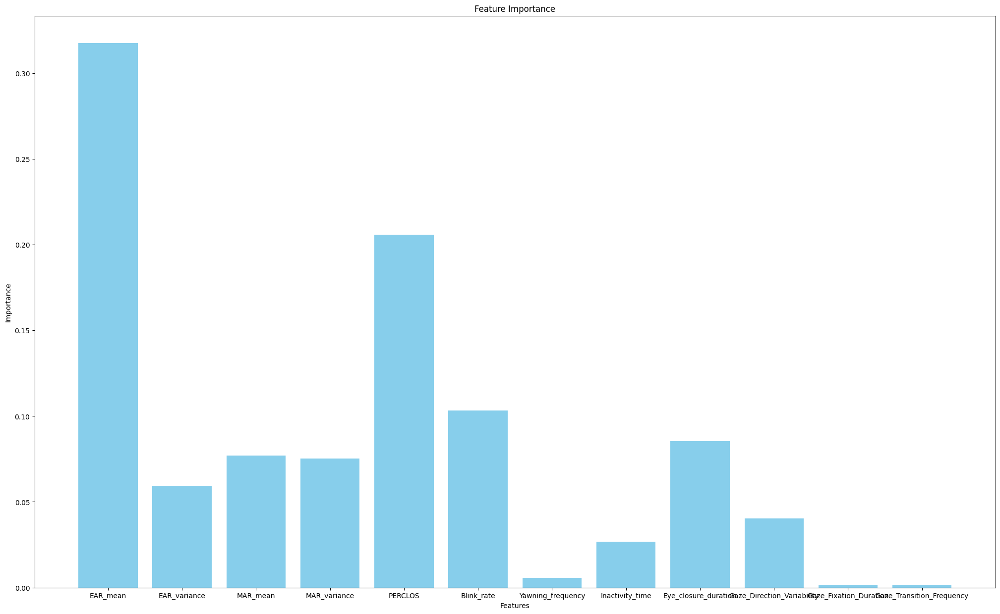

In [ ]:
# Feature importance from Random Forest
import matplotlib.pyplot as plt

importance = clf.feature_importances_
features = X_train.columns

plt.figure(figsize=(25, 15))
plt.bar(features, importance, color='skyblue')
plt.title("Feature Importance")
plt.ylabel("Importance")
plt.xlabel("Features")
plt.show()

***5. Train Using Important Features only***

In [ ]:
# Function to compute temporal features from a sequence
def compute_temporal_features(sequence):
    ear = sequence[:, 0]  # EAR values
    mar = sequence[:, 1]  # MAR values
    gaze = sequence[:,2]  # Gaze Direction

    features = {
        'EAR_mean': np.mean(ear),
        'EAR_variance': np.var(ear),
        'MAR_mean': np.mean(mar),
        'MAR_variance': np.var(mar),
        'PERCLOS': np.sum(ear < 0.2) / len(ear),  # Percentage of EAR below 0.2
        'Eye_closure_duration': compute_eye_closure_duration(ear),
        'Gaze_Direction_Variability': compute_gaze_direction_variability(gaze),
    }
    return features

# Process all sequences and extract temporal features
temporal_features = []
for sequence in X_sequences:
    features = compute_temporal_features(sequence)
    temporal_features.append(features)

# Convert to DataFrame and add labels
temporal_df = pd.DataFrame(temporal_features)
temporal_df['Label'] = y_sequences

# Save temporal features to CSV
temporal_features_file = '/content/drive/MyDrive/SanDiego/driver_drowsiness/features/temporal_features.csv'
temporal_df.to_csv(temporal_features_file, index=False)
print(f"Temporal features saved to {temporal_features_file}")


Temporal features saved to /content/drive/MyDrive/driver_drowsiness/features/temporal_features.csv


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Load temporal features
df_temporal = pd.read_csv(temporal_features_file)

# Features (X) and Labels (y)
X = df_temporal.drop(columns=['Label'])
y = df_temporal['Label']

# Split data into training (70%), validation (20%), and test (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.33, random_state=42, stratify=y_temp)

# Train Random Forest
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Evaluate model on validation and test sets
y_val_pred = clf.predict(X_val)
y_test_pred = clf.predict(X_test)

print("Validation Performance:")
print(classification_report(y_val, y_val_pred))
print("Test Performance:")
print(classification_report(y_test, y_test_pred))


Validation Performance:
              precision    recall  f1-score   support

         0.0       0.91      0.91      0.91       309
         1.0       0.93      0.93      0.93       387

    accuracy                           0.92       696
   macro avg       0.92      0.92      0.92       696
weighted avg       0.92      0.92      0.92       696

Test Performance:
              precision    recall  f1-score   support

         0.0       0.92      0.92      0.92       153
         1.0       0.94      0.93      0.93       190

    accuracy                           0.93       343
   macro avg       0.93      0.93      0.93       343
weighted avg       0.93      0.93      0.93       343



The earlier model with all features has a better recall for the Drowsy class.

***5. Hyper parameter tuning using Grid Search CV***

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split


# Function to compute temporal features from a sequence
def compute_temporal_features(sequence):
    ear = sequence[:, 0]  # EAR values
    mar = sequence[:, 1]  # MAR values
    gaze = sequence[:,2]  # Gaze Direction

    features = {
        'EAR_mean': np.mean(ear),
        'EAR_variance': np.var(ear),
        'MAR_mean': np.mean(mar),
        'MAR_variance': np.var(mar),
        'PERCLOS': np.sum(ear < 0.2) / len(ear),  # Percentage of EAR below 0.2
        'Blink_rate': np.sum(np.diff((ear < 0.2).astype(int)) == 1),
        'Yawning_frequency': np.sum(np.diff((mar > 0.5).astype(int)) == 1),
        'Inactivity_time': compute_inactivity_time(ear, mar),
        'Eye_closure_duration': compute_eye_closure_duration(ear),
        'Gaze_Direction_Variability': compute_gaze_direction_variability(gaze),
        'Gaze_Fixation_Duration': compute_gaze_fixation_duration(gaze),
        'Gaze_Transition_Frequency': compute_gaze_transition_frequency(gaze)
    }
    return features

# Process all sequences and extract temporal features
temporal_features = []
for sequence in X_sequences:
    features = compute_temporal_features(sequence)
    temporal_features.append(features)

# Convert to DataFrame and add labels
temporal_df = pd.DataFrame(temporal_features)
temporal_df['Label'] = y_sequences

# Save temporal features to CSV
temporal_features_file = '/content/drive/MyDrive/SanDiego/driver_drowsiness/features/temporal_features.csv'
temporal_df.to_csv(temporal_features_file, index=False)
print(f"Temporal features saved to {temporal_features_file}")

# Define the parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# Load temporal features
df_temporal = pd.read_csv(temporal_features_file)

# Features (X) and Labels (y)
X = df_temporal.drop(columns=['Label'])
y = df_temporal['Label']

# Split data into training (70%), validation (20%), and test (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.33, random_state=42, stratify=y_temp)

# Initialize the RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV with 5-fold cross-validation
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid,
                           cv=5, n_jobs=-1, verbose=2, scoring='accuracy')

# Fit GridSearchCV to the training data
grid_search.fit(X_train, y_train)

# Retrieve the best parameters and best estimator
best_params = grid_search.best_params_
best_rf = grid_search.best_estimator_

print(f"Best Hyperparameters: {best_params}")

# Evaluate the best model on the validation set
y_val_pred = best_rf.predict(X_val)
print("Validation Performance:")
print(classification_report(y_val, y_val_pred))

# Evaluate the best model on the test set
y_test_pred = best_rf.predict(X_test)
print("Test Performance:")
print(classification_report(y_test, y_test_pred))


Temporal features saved to /content/drive/MyDrive/driver_drowsiness/features/temporal_features.csv
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best Hyperparameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 200}
Validation Performance:
              precision    recall  f1-score   support

         0.0       0.92      0.90      0.91       309
         1.0       0.92      0.94      0.93       387

    accuracy                           0.92       696
   macro avg       0.92      0.92      0.92       696
weighted avg       0.92      0.92      0.92       696

Test Performance:
              precision    recall  f1-score   support

         0.0       0.90      0.91      0.91       153
         1.0       0.93      0.92      0.92       190

    accuracy                           0.92       343
   macro avg       0.91      0.91      0.91       343
weighted avg       0.92      0.92      0.92       343



**Analysis of Model Configurations**

***1) Default Parameters, All Features:***

Validation Accuracy: 92%

Test Accuracy: 93%

Balanced precision, recall, and F1-scores for both classes (0.92–0.93).

***2) Default Parameters, Limited Features:***

Validation Accuracy: 92%

Test Accuracy: 93%

Slightly higher test precision (0.94) for class 1 but no significant improvement over all features.

***3) GridSearch Best Parameters, All Features:***

Validation Accuracy: 92%

Test Accuracy: 92%

Test recall for class 0 slightly lower (0.90 compared to 0.92 in others).

***Conclussion:***
The Default Parameters with All Features configuration provides slightly better balance across validation and test sets, making it a reliable choice.

The Limited Features model shows competitive results, so if reducing computational complexity is essential, this is a viable option.

GridSearch tuning did not yield significant improvement, so further effort in hyperparameter optimization might not be necessary at this stage.

Decided to go with the 1st option here.

In [ ]:
print(temporal_features_file)

/content/drive/MyDrive/driver_drowsiness/features/temporal_features.csv


***6. Trying other ML models***

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/SanDiego/driver_drowsiness/features/temporal_features.csv')

# Separate features and labels
X = df.drop(columns=['Label'])
y = df['Label']

# Split data into training (70%), validation (20%), and test (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.33, random_state=42, stratify=y_temp)

# Initialize a StandardScaler
scaler = StandardScaler()

# Scale features for models that require it
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Define classifiers
classifiers = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Support Vector Machine': SVC(random_state=42),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB(),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'Neural Network': MLPClassifier(max_iter=1000, random_state=42)
}

# Evaluate each classifier
for name, clf in classifiers.items():
    # Use scaled data for models that are sensitive to feature scaling
    if name in ['Logistic Regression', 'Support Vector Machine', 'K-Nearest Neighbors', 'Neural Network']:
        clf.fit(X_train_scaled, y_train)
        y_val_pred = clf.predict(X_val_scaled)
    else:
        clf.fit(X_train, y_train)
        y_val_pred = clf.predict(X_val)

    print(f"{name} Performance on Validation Set:")
    print(classification_report(y_val, y_val_pred))
    print("-" * 60)


Logistic Regression Performance on Validation Set:
              precision    recall  f1-score   support

         0.0       0.93      0.91      0.92       309
         1.0       0.93      0.94      0.94       387

    accuracy                           0.93       696
   macro avg       0.93      0.93      0.93       696
weighted avg       0.93      0.93      0.93       696

------------------------------------------------------------
Support Vector Machine Performance on Validation Set:
              precision    recall  f1-score   support

         0.0       0.92      0.91      0.92       309
         1.0       0.93      0.94      0.93       387

    accuracy                           0.93       696
   macro avg       0.93      0.93      0.93       696
weighted avg       0.93      0.93      0.93       696

------------------------------------------------------------
K-Nearest Neighbors Performance on Validation Set:
              precision    recall  f1-score   support

         0.0 

Ensuring driver safety by accurately detecting drowsiness is paramount. In this context, recall for the drowsy class (Label 0) is crucial, as it measures the model's ability to correctly identify drowsy states, thereby minimizing the risk of missing such instances.

Below is a summary of the validation performance metrics for various models:

| Model                 | Precision (Label 0) | Recall (Label 0) | F1-Score (Label 0) | Precision (Label 1) | Recall (Label 1) | F1-Score (Label 1) | Accuracy |
|-----------------------|---------------------|------------------|--------------------|---------------------|------------------|--------------------|----------|
| Logistic Regression   | 0.93                | 0.91             | 0.92               | 0.93                | 0.94             | 0.94               | 0.93     |
| Support Vector Machine| 0.92                | 0.91             | 0.92               | 0.93                | 0.94             | 0.93               | 0.93     |
| K-Nearest Neighbors   | 0.91                | 0.90             | 0.91               | 0.92                | 0.93             | 0.93               | 0.92     |
| Naive Bayes           | 0.89                | 0.89             | 0.89               | 0.91                | 0.91             | 0.91               | 0.90     |
| Decision Tree         | 0.88                | 0.86             | 0.87               | 0.89                | 0.91             | 0.90               | 0.89     |
| Random Forest         | 0.92                | 0.90             | 0.91               | 0.92                | 0.94             | 0.93               | 0.92     |
| Gradient Boosting     | 0.92                | 0.92             | 0.92               | 0.94                | 0.94             | 0.94               | 0.93     |
| Neural Network        | 0.93                | 0.94             | 0.93               | 0.95                | 0.94             | 0.94               | 0.94     |

**Evaluation:**

- **Neural Network**: Exhibits the highest recall (0.94) for the drowsy class (Label 0), indicating superior capability in correctly identifying drowsy states. This high recall is critical for driver safety, as it reduces the likelihood of missing drowsiness instances.

- **Gradient Boosting**: Also demonstrates strong performance with a recall of 0.92 for Label 0, making it a viable alternative.

- **Logistic Regression** and **Support Vector Machine**: Both models show commendable performance with a recall of 0.91 for Label 0.

**Recommendation:**

Given the imperative to promptly alert drowsy drivers, the **Neural Network** model is recommended due to its highest recall for the drowsy class, ensuring that drowsiness instances are effectively detected and addressed.

*Note: While high recall is essential for safety, it's important to balance it with precision to avoid excessive false alarms, which could lead to alert fatigue. Continuous monitoring and periodic retraining of the model with new data are advised to maintain optimal performance.*

So Decided to go with Neural Network

**7. Trying to enhance the performance further with hyperparameter tuning, regularization, and cross-validation of Neural Network model.**


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


1. Data Preparation and Feature Scaling

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/SanDiego/driver_drowsiness/features/temporal_features.csv')

# Separate features and labels
X = data.drop(columns=['Label'])
y = data['Label']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


2. Hyperparameter Tuning with Cross-Validation and feature scaling

In [ ]:
pip install scikeras

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report

# Assuming X and y are your features and labels respectively
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define a pipeline with StandardScaler and MLPClassifier
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Feature scaling
    ('mlp', MLPClassifier(max_iter=1000, random_state=42))
])

# Define the parameter grid for GridSearchCV
param_grid = {
    'mlp__hidden_layer_sizes': [(50,), (100,), (50,50), (100,50)],
    'mlp__activation': ['tanh', 'relu'],
    'mlp__solver': ['sgd', 'adam'],
    'mlp__alpha': [0.0001, 0.001, 0.01],
    'mlp__learning_rate': ['constant', 'adaptive'],
}

# Initialize GridSearchCV with cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=5, n_jobs=-1, verbose=2)

# Fit the model
grid_search.fit(X_train, y_train)

# Print the best parameters and best score
print(f"Best parameters found: {grid_search.best_params_}")
print(f"Best cross-validation accuracy: {grid_search.best_score_:.2f}")

# Evaluate the model on the test set
y_pred = grid_search.predict(X_test)
print("Classification Report:")
print(classification_report(y_test, y_pred))


Fitting 5 folds for each of 96 candidates, totalling 480 fits
Best parameters found: {'mlp__activation': 'tanh', 'mlp__alpha': 0.01, 'mlp__hidden_layer_sizes': (100,), 'mlp__learning_rate': 'constant', 'mlp__solver': 'adam'}
Best cross-validation accuracy: 0.94
Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.92      0.93       335
         1.0       0.93      0.96      0.94       358

    accuracy                           0.94       693
   macro avg       0.94      0.94      0.94       693
weighted avg       0.94      0.94      0.94       693



The earlier Neural Network model has a higher recall for Label 0, indicating it is more effective at correctly identifying drowsy drivers. Hence we decide to go with that model only.

**8. Saving the best Neural Network model for future use.**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report

# Load the dataset
df = pd.read_csv('/content/drive/MyDrive/SanDiego/driver_drowsiness/features/temporal_features.csv')

# Separate features and labels
X = df.drop(columns=['Label'])
y = df['Label']

# Split data into training (70%), validation (20%), and test (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.33, random_state=42, stratify=y_temp)

# Initialize a StandardScaler
scaler = StandardScaler()

# Scale features for models that require it
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Define classifiers
classifiers = {
    'Neural Network': MLPClassifier(max_iter=1000, random_state=42)
}

# Evaluate each classifier
for name, clf in classifiers.items():
    # Use scaled data for models that are sensitive to feature scaling
    clf.fit(X_train_scaled, y_train)
    y_val_pred = clf.predict(X_val_scaled)

    print(f"{name} Performance on Validation Set:")
    print(classification_report(y_val, y_val_pred))
    print("-" * 60)


Neural Network Performance on Validation Set:
              precision    recall  f1-score   support

         0.0       0.92      0.94      0.93       309
         1.0       0.95      0.94      0.94       387

    accuracy                           0.94       696
   macro avg       0.94      0.94      0.94       696
weighted avg       0.94      0.94      0.94       696

------------------------------------------------------------


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

model_path = '/content/drive/MyDrive/SanDiego/driver_drowsiness/NueralNetworkDriverDrowsiness_AllFeatures.pkl'

import pickle

# Save the model to the specified path
with open(model_path, 'wb') as file:
    pickle.dump(clf, file)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


***9. LSTM Modelling***

In [2]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [5]:
import os
import numpy as np
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import img_to_array, load_img, ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, TimeDistributed, LSTM, Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.regularizers import l2
from tensorflow.keras.backend import clear_session

# Parameters
sequence_length = 5  # Number of frames per sequence
img_height, img_width = 224, 224  # Image dimensions
batch_size = 16
epochs = 20
num_folds = 2  # For cross-validation

# Paths
data_dir = '/content/drive/MyDrive/SanDiego/driver_drowsiness/cleaned'
classes = ['Drowsy', 'Non Drowsy']

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Function to load and augment images
def load_and_augment_images(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img_path = os.path.join(folder, filename)
        img = load_img(img_path, target_size=(img_height, img_width))
        img_array = img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        img_array = datagen.random_transform(img_array[0])  # Apply augmentation
        images.append(img_array)
    return np.array(images)

# Generate sequences and labels
def generate_sequences(data_dir, classes, sequence_length):
    sequences = []
    labels = []
    for label, class_name in enumerate(classes):
        class_folder = os.path.join(data_dir, class_name)
        images = load_and_augment_images(class_folder)
        num_sequences = len(images) // sequence_length
        for i in range(num_sequences):
            sequence = images[i * sequence_length:(i + 1) * sequence_length]
            sequences.append(sequence)
            labels.append(label)
    return np.array(sequences), np.array(labels)

# Generate data
X, y = generate_sequences(data_dir, classes, sequence_length)
y = to_categorical(y, num_classes=len(classes))

# Normalize pixel values to [0, 1]
X = X / 255.0

# Define the model architecture
def create_model():
    input_shape = (sequence_length, img_height, img_width, 3)
    inputs = Input(shape=input_shape)
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
    base_model.trainable = False
    x = TimeDistributed(base_model)(inputs)
    x = TimeDistributed(Flatten())(x)
    x = Dropout(0.5)(x)  # Regularization
    x = LSTM(50, activation='relu', kernel_regularizer=l2(0.001))(x)
    x = Dropout(0.5)(x)  # Regularization
    outputs = Dense(len(classes), activation='softmax', kernel_regularizer=l2(0.001))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer=Adam(learning_rate=0.0005), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Cross-validation
skf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)
fold_no = 1

for train_index, val_index in skf.split(X, np.argmax(y, axis=1)):
    print(f'\nTraining fold {fold_no}...')

    # Split the data
    X_train, X_val = X[train_index], X[val_index]
    y_train, y_val = y[train_index], y[val_index]

    # Create model
    model = create_model()

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=1e-6, verbose=1)
    model_checkpoint = ModelCheckpoint(
        filepath=f'/content/drive/MyDrive/SanDiego/driver_drowsiness/drowsiness_model_fold_{fold_no}.keras',
        monitor='val_loss',
        save_best_only=True
    )

    # Train the model
    history = model.fit(
        X_train, y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(X_val, y_val),
        callbacks=[early_stopping, reduce_lr, model_checkpoint]
    )

    # Clear session to free up memory
    clear_session()
    fold_no += 1



Training fold 1...
Epoch 1/20
138/138 ━━━━━━━━━━━━━━━━━━━━ 33s 193ms/step - accuracy: 0.5282 - loss: 1.1355 - val_accuracy: 0.7049 - val_loss: 0.6819 - learning_rate: 5.0000e-04
Epoch 2/20
138/138 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - accuracy: 0.6089 - loss: 0.7246 - val_accuracy: 0.7653 - val_loss: 0.5513 - learning_rate: 5.0000e-04
Epoch 3/20
138/138 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - accuracy: 0.6994 - loss: 0.6090 - val_accuracy: 0.5871 - val_loss: 0.7295 - learning_rate: 5.0000e-04
Epoch 4/20
138/138 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - accuracy: 0.6433 - loss: 0.7024 - val_accuracy: 0.8095 - val_loss: 0.5500 - learning_rate: 5.0000e-04
Epoch 5/20
138/138 ━━━━━━━━━━━━━━━━━━━━ 13s 91ms/step - accuracy: 0.6306 - loss: 0.6498 - val_accuracy: 0.8172 - val_loss: 0.4765 - learning_rate: 5.0000e-04
Epoch 6/20
138/138 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - accuracy: 0.6685 - loss: 0.6027 - val_accuracy: 0.8499 - val_loss: 0.4009 - learning_rate: 5.0000e-04
Epoch 7/20
138/138 ━━━━━━━━━━━━

***Accuracy Improvement:***

We achieved significant improvement in validation accuracy across both folds, peaking at around 95%–97% in the later epochs. This indicates that the model is learning effectively.

***Loss Reduction:***

Validation loss consistently decreased in both folds, showing convergence. This is a good indicator of the model's performance.

***Learning Rate Schedulin***g:

The ReduceLROnPlateau callback appears to have worked well, adjusting the learning rate when the validation loss plateaued. This helped improve performance in later epochs without overfitting.

***Regularization:***

We included dropout layers and L2 regularization in the architecture, which likely helped mitigate overfitting.

***Cross-Validation:***

Using 2-fold cross-validation provided robustness to our results, ensuring that the performance is not dataset-dependent.

**Potential Concerns**

***Initial Fluctuations:***

In the early epochs, there are some fluctuations in validation accuracy and loss, especially in fold 1 (e.g., a drop in accuracy from epoch 2 to epoch 3). While this isn't inherently bad, it could indicate that the model was overfitting to some patterns early on.

***Validation Accuracy Higher Than Training Accuracy:***

In some epochs, the validation accuracy surpasses the training accuracy (e.g., fold 2, epochs 4–5). This could indicate data augmentation or dropout acting as a regularizer in training, making the training task more challenging than the validation task.

***Small Number of Folds:***

Using only two folds for cross-validation might not capture the full variability of the dataset. Increasing the number of folds (e.g., 5 or 10) would provide a more comprehensive assessment of model performance.

***Potential for Further Improvement:***

Despite good performance, there might still be room for improvement in generalization, especially in reducing the validation loss further.


***10. Trying out with 3 fold training***


In [3]:
import os
import numpy as np
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import img_to_array, load_img, ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, TimeDistributed, LSTM, Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.regularizers import l2
from tensorflow.keras.backend import clear_session

# Parameters
sequence_length = 5  # Number of frames per sequence
img_height, img_width = 224, 224  # Image dimensions
batch_size = 16
epochs = 20
num_folds = 3  # For cross-validation

# Paths
data_dir = '/content/drive/MyDrive/SanDiego/driver_drowsiness/cleaned'
classes = ['Drowsy', 'Non Drowsy']

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Function to load and augment images
def load_and_augment_images(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img_path = os.path.join(folder, filename)
        img = load_img(img_path, target_size=(img_height, img_width))
        img_array = img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        img_array = datagen.random_transform(img_array[0])  # Apply augmentation
        images.append(img_array)
    return np.array(images)

# Generate sequences and labels
def generate_sequences(data_dir, classes, sequence_length):
    sequences = []
    labels = []
    for label, class_name in enumerate(classes):
        class_folder = os.path.join(data_dir, class_name)
        images = load_and_augment_images(class_folder)
        num_sequences = len(images) // sequence_length
        for i in range(num_sequences):
            sequence = images[i * sequence_length:(i + 1) * sequence_length]
            sequences.append(sequence)
            labels.append(label)
    return np.array(sequences), np.array(labels)

# Generate data
X, y = generate_sequences(data_dir, classes, sequence_length)
y = to_categorical(y, num_classes=len(classes))

# Normalize pixel values to [0, 1]
X = X / 255.0

# Define the model architecture
def create_model():
    input_shape = (sequence_length, img_height, img_width, 3)
    inputs = Input(shape=input_shape)
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
    base_model.trainable = False
    x = TimeDistributed(base_model)(inputs)
    x = TimeDistributed(Flatten())(x)
    x = Dropout(0.5)(x)  # Regularization
    x = LSTM(50, activation='relu', kernel_regularizer=l2(0.001))(x)
    x = Dropout(0.5)(x)  # Regularization
    outputs = Dense(len(classes), activation='softmax', kernel_regularizer=l2(0.001))(x)
    model = Model(inputs, outputs)
    model.compile(optimizer=Adam(learning_rate=0.0005), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Cross-validation
skf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)
fold_no = 1

for train_index, val_index in skf.split(X, np.argmax(y, axis=1)):
    print(f'\nTraining fold {fold_no}...')

    # Split the data
    X_train, X_val = X[train_index], X[val_index]
    y_train, y_val = y[train_index], y[val_index]

    # Create model
    model = create_model()

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=1e-6, verbose=1)
    model_checkpoint = ModelCheckpoint(
        filepath=f'/content/drive/MyDrive/SanDiego/driver_drowsiness/drowsiness_model_fold_{fold_no}.keras',
        monitor='val_loss',
        save_best_only=True
    )

    # Train the model
    history = model.fit(
        X_train, y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(X_val, y_val),
        callbacks=[early_stopping, reduce_lr, model_checkpoint]
    )

    # Clear session to free up memory
    clear_session()
    fold_no += 1



Training fold 1...
Epoch 1/20
184/184 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - accuracy: 0.5124 - loss: 1.2088 - val_accuracy: 0.7285 - val_loss: 0.7550 - learning_rate: 5.0000e-04
Epoch 2/20
184/184 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.5884 - loss: 0.7436 - val_accuracy: 0.8533 - val_loss: 0.6270 - learning_rate: 5.0000e-04
Epoch 3/20
184/184 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - accuracy: 0.6423 - loss: 0.6656 - val_accuracy: 0.7456 - val_loss: 0.6825 - learning_rate: 5.0000e-04
Epoch 4/20
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.6626 - loss: 0.6291
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
184/184 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - accuracy: 0.6625 - loss: 0.6291 - val_accuracy: 0.7149 - val_loss: 0.6602 - learning_rate: 5.0000e-04
Epoch 5/20
184/184 ━━━━━━━━━━━━━━━━━━━━ 13s 69ms/step - accuracy: 0.6625 - loss: 0.6113 - val_accuracy: 0.9209 - val_loss: 0.4561 - learning_rate: 1.0000e-04
Epoch 6/20
184/184 ━━━━━━━━━━━━━━━━━

### **Comparison with Fold Context**

| **Aspect**              | **Second Set (3 Folds)**                  | **First Set (2 Folds)**              |
|--------------------------|------------------------------------------|---------------------------------------|
| **Cross-Fold Consistency** | More folds allow better generalization check. Shows variability between folds. | Fewer folds; consistency seems better, but it's harder to confirm generalization. |
| **Validation Accuracy**   | Peaks higher (up to ~98.77% in some folds). | Slightly lower peak accuracy (~97.18%), but steady improvement. |
| **Validation Loss**       | Fluctuates in early epochs; stabilizes in later epochs. | Steady decrease, suggesting smoother learning. |
| **Number of Data Splits Evaluated** | Higher robustness due to more folds. | Lower robustness due to fewer folds. |

---

### **Recommendation**
The **number of folds** (and robustness of the evaluation) is a critical factor. Hence  **second set with 3 folds** should be chosen:
- The second set evaluates performance across more splits, providing greater confidence in the model's generalization ability.
- The slightly higher peak accuracy (~98.77%) indicates that the model can learn more effectively given enough epochs and data.